# Predicting Delivery Status for a Shipment by estimating the Shipment Delays


<h4> Research Description : </h4> 

In today’s fast-paced world, efficient delivery and logistics are crucial for businesses. Predicting delivery times accurately and estimating shipment delays can help companies 
streamline their operations, optimize resources, and provide better customer service. Machine learning techniques can be employed to analyze historical data and build predictive 
models that can forecast delivery times and identify potential delays.

I will consider one such example dataset from FedEx logictics company. Here, Business has to evaluate a lot of factors before taking a decision to deliver a package. The objective 
of this project is to optimize the process of planning delivery.

Predicting delivery time and estimating shipment delays with machine learning can be a valuable tool for businesses in the logistics industry. It allows them to make data-driven 
decisions, optimize their operations, and provide better service to their customers.To address this I am working on this project which will maximize the security of deliveries and
minimize dissappointments of lost.

<h4> Goal : </h4>

Before diving into the implementation, let’s understand the problem we are trying to solve. Our goal is to predict the delivery status for shipments and by estimating potential 
delays and compare with the Planned_Delivery_Time based on historical data from 2008. We will use machine learning algorithms to train a model that can learn from past deliveries 
and make predictions on new, unseen data. The analysis also include other features to predict the delivery_status.


<h3> Standard import libraries </h3>

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
from scipy import stats

import matplotlib.pyplot as plt
from matplotlib import pylab
%matplotlib inline
import seaborn as sns
import plotly.express as px


from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder


import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('data/fedex.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3604175 entries, 0 to 3604174
Data columns (total 15 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Year                   int64  
 1   Month                  int64  
 2   DayofMonth             int64  
 3   DayOfWeek              int64  
 4   Actual_Shipment_Time   float64
 5   Planned_Shipment_Time  int64  
 6   Planned_Delivery_Time  int64  
 7   Carrier_Name           object 
 8   Carrier_Num            int64  
 9   Planned_TimeofTravel   float64
 10  Shipment_Delay         float64
 11  Source                 object 
 12  Destination            object 
 13  Distance               int64  
 14  Delivery_Status        float64
dtypes: float64(4), int64(8), object(3)
memory usage: 412.5+ MB


In [4]:
df.sample(15)

,Year,Month,DayofMonth,DayOfWeek,Actual_Shipment_Time,Planned_Shipment_Time,Planned_Delivery_Time,Carrier_Name,Carrier_Num,Planned_TimeofTravel,Shipment_Delay,Source,Destination,Distance,Delivery_Status
3495612,2008,6,30,1,1126.0,1125,1335,AA,1145,190.0,1.0,ORD,SLC,1249,0.0
2059038,2008,4,13,7,930.0,940,1423,US,393,163.0,-10.0,LAS,DFW,1055,0.0
2935017,2008,5,6,2,2123.0,2135,2354,B6,491,259.0,-12.0,BOS,DEN,1754,0.0
1172791,2008,2,12,2,631.0,630,1015,DL,1747,345.0,1.0,BOS,SLC,2105,0.0
3175496,2008,6,7,6,1328.0,1235,1431,OO,5944,116.0,53.0,ORD,FAR,557,1.0
853776,2008,2,5,2,1333.0,1321,1729,US,351,188.0,12.0,PHX,MSP,1276,0.0
1599732,2008,3,22,6,553.0,600,735,MQ,4714,95.0,-7.0,RDU,JFK,426,0.0
359391,2008,1,8,2,1916.0,1926,2103,FL,643,97.0,-10.0,BOS,PHF,464,0.0
1573580,2008,3,17,1,1609.0,1600,1800,MQ,3579,120.0,9.0,DFW,CID,685,0.0
356974,2008,1,5,6,2130.0,2115,2253,FL,218,98.0,15.0,ATL,CAK,528,0.0


<h3> Data Description </h3>

<h4> Dataset contains 3604175 delivery details
15 features are recorded for each delivery </h4>

Year -- The Year the data was collected

Month -- The Month in which the data was collected

DayofMonth -- The day of the month

DayofWeek -- The day of Week

Actual_Shipment_Time -- The Actual time when the package was sent for shipment. (ex: 1955 means 19 hours and 55 minutes i.e 7:55 PM)

Planned_Shipment_Time -- The time when the package should have been sent for shipment. (ex: 1955 means 19 hours and 55 minutes i.e 7:55 PM)

Planned_Delivery_Time -- The time when the package should be delivered. (ex: 1955 means 19 hours and 55 minutes i.e 7:55 PM)

Carrier_Name -- The name of the Carrier which carried the package.

Carrier_Num -- The number of the Carrier which carried the package.

Planned_TimeofTravel -- The estimated time to reach from Source to Destination. ( in minutes)

Shipment_Delay -- The time by which the package was shipped late. (in minutes. Negative value indicates that the package was 
shipped early. Ex: 4 indicates that the package was shipped 4 minutes late, whereas, -4 indicates that the package was shipped 4 minutes early)

Source -- The place from which the package was shipped.

Destination -- The place at which the package was delivered.

Distance -- Distance between Source and Destination in miles.

Delivery_Status -- Whether it got delivered at right time or not. (Dependent Variable)

<h3> Handling missing/duplicate values </h3>

In [5]:
#Checking for NAN values
df.isnull().sum()

Year                         0
Month                        0
DayofMonth                   0
DayOfWeek                    0
Actual_Shipment_Time     81602
Planned_Shipment_Time        0
Planned_Delivery_Time        0
Carrier_Name                 0
Carrier_Num                  0
Planned_TimeofTravel       547
Shipment_Delay           81602
Source                       0
Destination                  0
Distance                     0
Delivery_Status          81602
dtype: int64

In [6]:
# Dropping the NAN as the Delivery status is also null
df.dropna(inplace=True)

In [7]:
df.isna().sum()

Year                     0
Month                    0
DayofMonth               0
DayOfWeek                0
Actual_Shipment_Time     0
Planned_Shipment_Time    0
Planned_Delivery_Time    0
Carrier_Name             0
Carrier_Num              0
Planned_TimeofTravel     0
Shipment_Delay           0
Source                   0
Destination              0
Distance                 0
Delivery_Status          0
dtype: int64

In [8]:
df.shape

(3522167, 15)

In [9]:
#Checking for Duplicates
df.duplicated(keep=False).sum()

8

In [10]:
# Removing Duplicates
df.drop_duplicates(inplace=True) # Returns DataFrame with duplicate rows removed.

In [11]:
df.shape

(3522163, 15)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3522163 entries, 0 to 3604174
Data columns (total 15 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Year                   int64  
 1   Month                  int64  
 2   DayofMonth             int64  
 3   DayOfWeek              int64  
 4   Actual_Shipment_Time   float64
 5   Planned_Shipment_Time  int64  
 6   Planned_Delivery_Time  int64  
 7   Carrier_Name           object 
 8   Carrier_Num            int64  
 9   Planned_TimeofTravel   float64
 10  Shipment_Delay         float64
 11  Source                 object 
 12  Destination            object 
 13  Distance               int64  
 14  Delivery_Status        float64
dtypes: float64(4), int64(8), object(3)
memory usage: 430.0+ MB


In [13]:
#Handling the features and datatypes
df['date'] = df.apply(lambda x: datetime(x['Year'], x['Month'], x['DayofMonth']), axis=1)

In [14]:
# Dropping the Year, Month, Dayofmonth, Dayof Week as we have converted these to date in the above code
df.drop(['Year', 'Month', 'DayofMonth', 'DayOfWeek'], axis=1, inplace=True)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3522163 entries, 0 to 3604174
Data columns (total 12 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   Actual_Shipment_Time   float64       
 1   Planned_Shipment_Time  int64         
 2   Planned_Delivery_Time  int64         
 3   Carrier_Name           object        
 4   Carrier_Num            int64         
 5   Planned_TimeofTravel   float64       
 6   Shipment_Delay         float64       
 7   Source                 object        
 8   Destination            object        
 9   Distance               int64         
 10  Delivery_Status        float64       
 11  date                   datetime64[ns]
dtypes: datetime64[ns](1), float64(4), int64(4), object(3)
memory usage: 349.3+ MB


In [16]:
# df['Actual_Shipment_Time','Planned_Shipment_Time','Planned_Delivery_Time','Carrier_Name','Carrier_Num',
#    'Planned_TimeofTravel','Shipment_Delay','Source','Destination','Distance ','Delivery_Status','date']

In [17]:
#Converting the datatypes for features
df.Actual_Shipment_Time = df.Actual_Shipment_Time.astype(int)
df.Planned_TimeofTravel = df.Planned_TimeofTravel.astype(int)
df.Shipment_Delay = df.Shipment_Delay.astype(int)
df.Delivery_Status = df.Delivery_Status.astype(int)

In [18]:
df.dtypes

Actual_Shipment_Time              int32
Planned_Shipment_Time             int64
Planned_Delivery_Time             int64
Carrier_Name                     object
Carrier_Num                       int64
Planned_TimeofTravel              int32
Shipment_Delay                    int32
Source                           object
Destination                      object
Distance                          int64
Delivery_Status                   int32
date                     datetime64[ns]
dtype: object

In [19]:
df.Delivery_Status.value_counts()

Delivery_Status
0    2804071
1     718092
Name: count, dtype: int64

<h3> Exploratory Data Analysis (EDA) </h3>

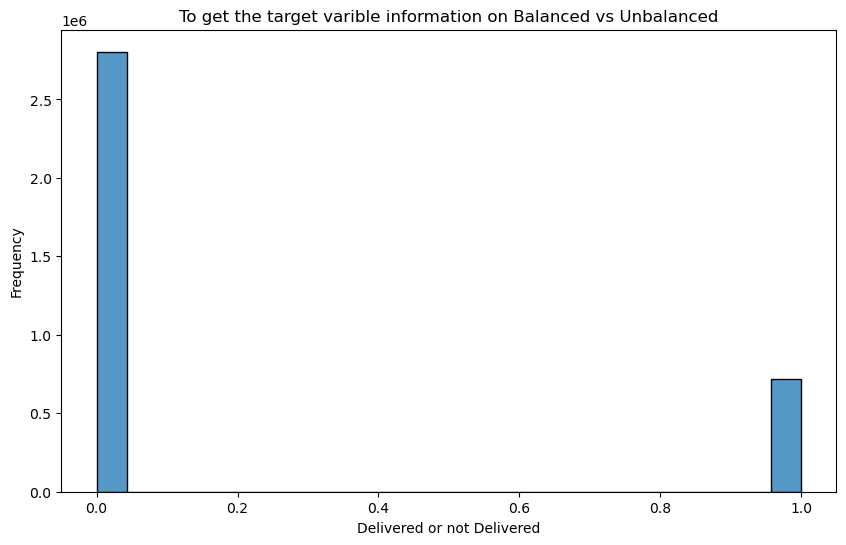

<Figure size 640x480 with 0 Axes>

In [20]:
# visualize the classifiers of the target variable
plt.figure(figsize=(10, 6))
sns.histplot(df['Delivery_Status'])
plt.title('To get the target varible information on Balanced vs Unbalanced')
plt.xlabel('Delivered or not Delivered')
plt.ylabel('Frequency')
plt.show()
plt.savefig('images/balancedvsunbalanced.png')

In [21]:
df.sample(5)

,Actual_Shipment_Time,Planned_Shipment_Time,Planned_Delivery_Time,Carrier_Name,Carrier_Num,Planned_TimeofTravel,Shipment_Delay,Source,Destination,Distance,Delivery_Status,date
1340163,1329,1330,1527,OH,5244,117,-1,JAX,CVG,614,0,2008-03-22
2940889,1312,1320,1619,B6,377,179,-8,LGA,FLL,1076,0,2008-05-17
1135274,2034,1950,2302,CO,638,192,44,EWR,MIA,1086,1,2008-02-09
1090347,1007,1005,1125,AA,1779,200,2,DFW,SNA,1205,0,2008-02-23
3051639,1928,1900,2135,WN,1833,275,28,MDW,SJC,1838,1,2008-06-19


<h4> Visualize the features and understand the association between each other </h4>

In [22]:
#Pie chart for Source, Destination and Carrier_Name to observe the similarities with Dalievery Status
fig = px.pie(df['Source'].value_counts().reset_index(name='count'), values='count', names='Source', title='Track the popular Sources')
fig.show()
fig.write_html("images/Sourec_Pie_Chart.png")

In [23]:
fig = px.pie(df['Destination'].value_counts().reset_index(name='count'), values='count', names='Destination',title='Track the popular Destinations')
fig.show()
fig.write_html("images/Destination_Pie_Chart.png")

In [24]:
fig = px.pie(df['Carrier_Name'].value_counts().reset_index(name='count'), values='count', names='Carrier_Name', title='Track the popular Carrier_Names')
fig.show()
fig.write_html("images/Carrier_Name_Pie_Chart.png")

<h4> As you can see the ablve 3 pie charts: 
    
    1. Highest 3 source locations are 'ALT','ORD','DFW'
    
    2. Highest 3 destination locations are 'ALT','ORD','DFW'
    
    3. Highest 3 carrier_names are 'WN','AA','OO'
</h4>

In [25]:
#Comparison between the Actual vs Planned Shipment Time with Delivery statues.
fig = px.line(df[['Actual_Shipment_Time', 'date', 'Delivery_Status']].groupby(['date', 'Delivery_Status']).mean().sort_index().reset_index(),
                x='date', y='Actual_Shipment_Time', color='Delivery_Status', color_discrete_map={0: 'red', 1: 'blue'}, title = 'Observe the Actual_Shipment_Time on Delivery Status')
fig.show()
fig.write_html("images/Actual_Shipment_Time.png")

In [26]:
fig = px.line(df[['Planned_Shipment_Time', 'date', 'Delivery_Status']].groupby(['date', 'Delivery_Status']).mean().sort_index().reset_index(),
                x='date', y='Planned_Shipment_Time', color='Delivery_Status', color_discrete_map={0: 'red', 1: 'blue'},title = 'Observe the Planned_Shipment_Time on Delivery Status')
fig.show()
fig.write_html("images/Planned_Shipment_Time.png")

<h4> When looking at the above line charts , there is no much fluctuation in the Delivery Status 0 between Planned and Actual however, i see there is a fluctuation in the Delivery Status 1 between Planned and Actual.This concludes the shipment time does impact on the Delivery Status.  </h4>

In [27]:
#Comparison between the Planned Delivery Time, Planned_TimeofTravel, Distance with Delivery statues.
fig = px.line(df[['Planned_TimeofTravel', 'date', 'Delivery_Status']].groupby(['date', 'Delivery_Status']).mean().sort_index().reset_index(),
                x='date', y='Planned_TimeofTravel', color='Delivery_Status', color_discrete_map={0: 'red', 1: 'blue'},title = 'Observe the Planned_TimeofTravel on Delivery Status')
fig.show()
fig.write_html("images/Planned_TimeofTravel.png")

In [28]:
fig = px.line(df[['Distance', 'date', 'Delivery_Status']].groupby(['date', 'Delivery_Status']).mean().sort_index().reset_index(),
                x='date', y='Distance', color='Delivery_Status', color_discrete_map={0: 'red', 1: 'blue'},title = 'Observe the Distance on Delivery Status')
fig.show()
fig.write_html("images/Distance.png")

In [29]:
fig = px.line(df[['Planned_Delivery_Time', 'date', 'Delivery_Status']].groupby(['date', 'Delivery_Status']).mean().sort_index().reset_index(),
                x='date', y='Planned_Delivery_Time', color='Delivery_Status', color_discrete_map={0: 'red', 1: 'blue'},title = 'Observe the Planned_Delivery_Time on Delivery Status')
fig.show()
fig.write_html("images/Planned_Delivery_Time.png")

In [30]:
fig = px.line(df[['Shipment_Delay', 'date', 'Delivery_Status']].groupby(['date', 'Delivery_Status']).mean().sort_index().reset_index(),
                x='date', y='Shipment_Delay', color='Delivery_Status', color_discrete_map={0: 'red', 1: 'blue'},title = 'Observe the Shipment_Delay on Delivery Status')
fig.show()
fig.write_html("images/Shipment_Delay.png")

<h4> Based on the above line charts for Time of travel , Distance and Planned Delivery time :
    
1. Time of Travel says the longer the time to deliver a pacakge the higher chnace of that package not getting delivered or being lost

2. Distance also has a similar observation where it says farther the distance the higher chance of package not being delivered or being lost.
    
3. However we could get much infomration from the Planned Delivery time and Shipment _Delay
</h4>

In [31]:
nominal_cat_cols = ['Carrier_Name','Source','Destination']
nominal_cat_cols.sort()
ordinal_cat_cols = ['Actual_Shipment_Time', 'Planned_Shipment_Time', 'Planned_Delivery_Time']
numerical_cols = ['Carrier_Num','Planned_TimeofTravel','Shipment_Delay','Distance']

In [32]:
# Skewness & Kurtosis
df[numerical_cols].skew()

Carrier_Num             0.906269
Planned_TimeofTravel    1.493550
Shipment_Delay          6.257128
Distance                1.622148
dtype: float64

<Figure size 1000x600 with 0 Axes>

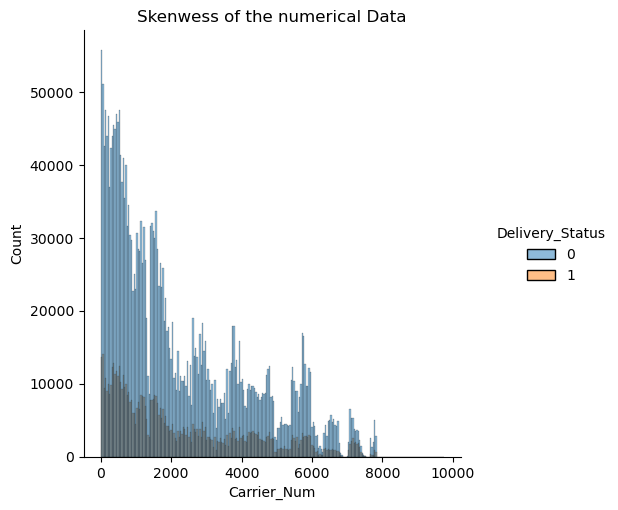

<Figure size 640x480 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

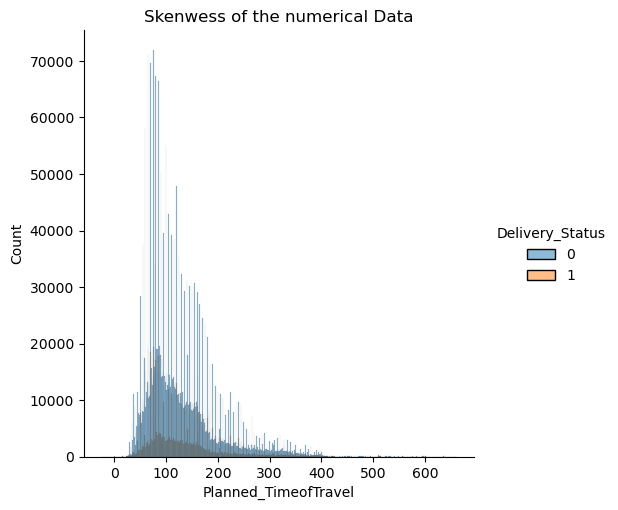

<Figure size 640x480 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

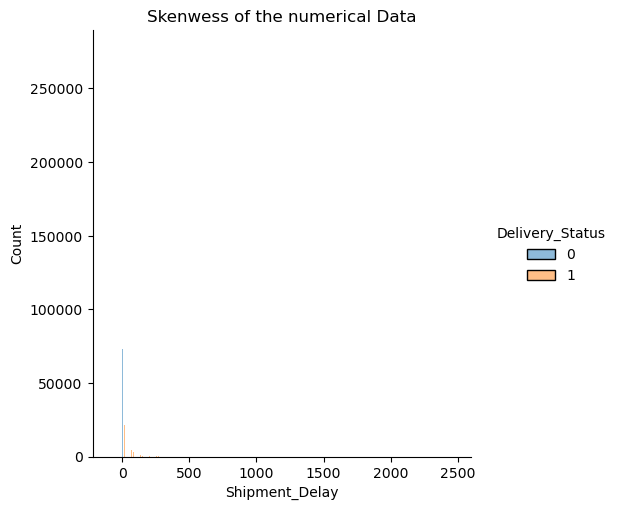

<Figure size 640x480 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

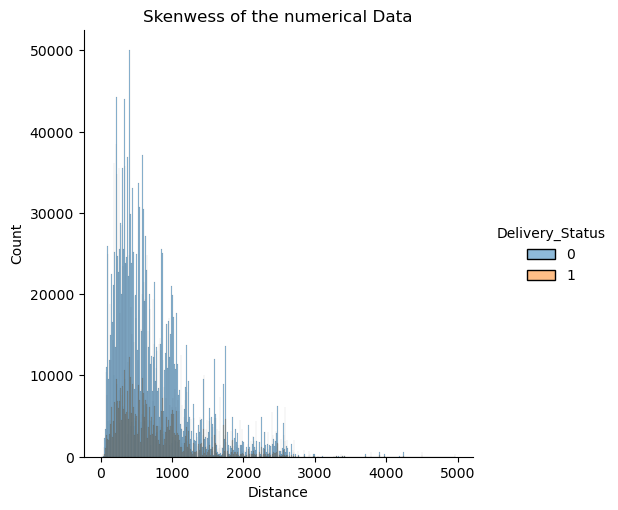

<Figure size 640x480 with 0 Axes>

In [33]:
#Visualize the Skenwess of the above 
for column in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.displot(df, x=column, hue='Delivery_Status')
    plt.title('Skenwess of the numerical Data')
    plt.show()
    plt.savefig('images/Historgram on the numerical data.png')

In [34]:
df[ordinal_cat_cols].skew()

Actual_Shipment_Time     0.043858
Planned_Shipment_Time    0.086629
Planned_Delivery_Time   -0.204917
dtype: float64

<Figure size 1000x600 with 0 Axes>

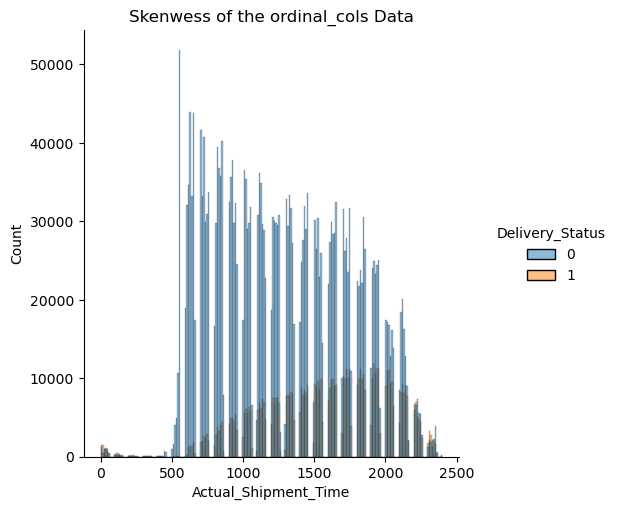

<Figure size 640x480 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

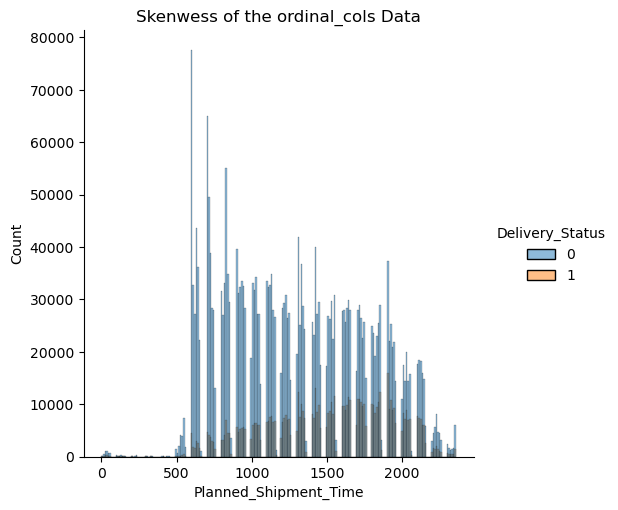

<Figure size 640x480 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

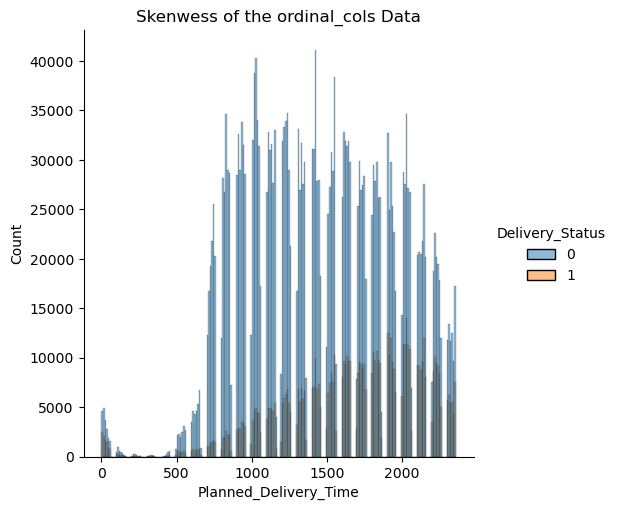

<Figure size 640x480 with 0 Axes>

In [35]:
#Visualize the Skenwess of the above ordinal columns
for column in ordinal_cat_cols:
    plt.figure(figsize=(10, 6))
    sns.displot(df, x=column, hue='Delivery_Status')
    plt.title('Skenwess of the ordinal_cols Data')
    plt.show()
    plt.savefig('images/Historgram on the ordinal_cols data.png')

In [36]:
df[numerical_cols].kurt()

Carrier_Num             -0.217094
Planned_TimeofTravel     2.735711
Shipment_Delay          96.077752
Distance                 3.273434
dtype: float64

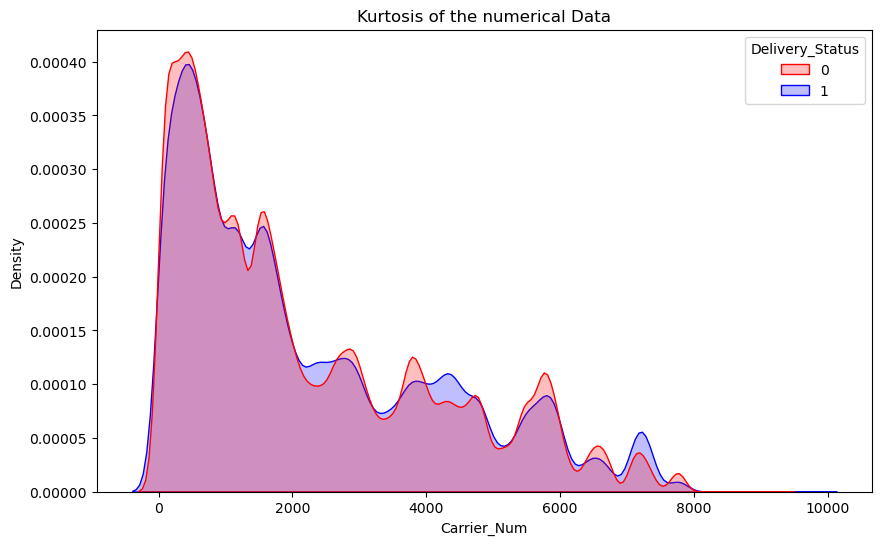

<Figure size 640x480 with 0 Axes>

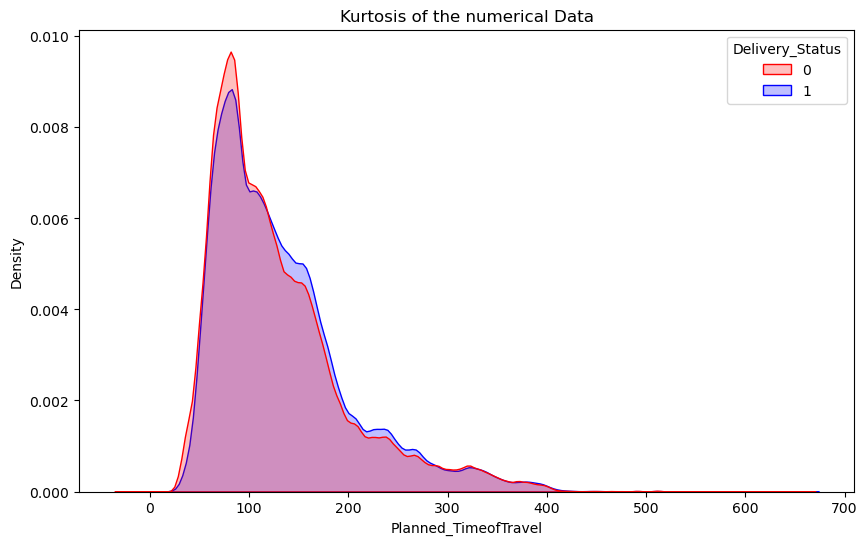

<Figure size 640x480 with 0 Axes>

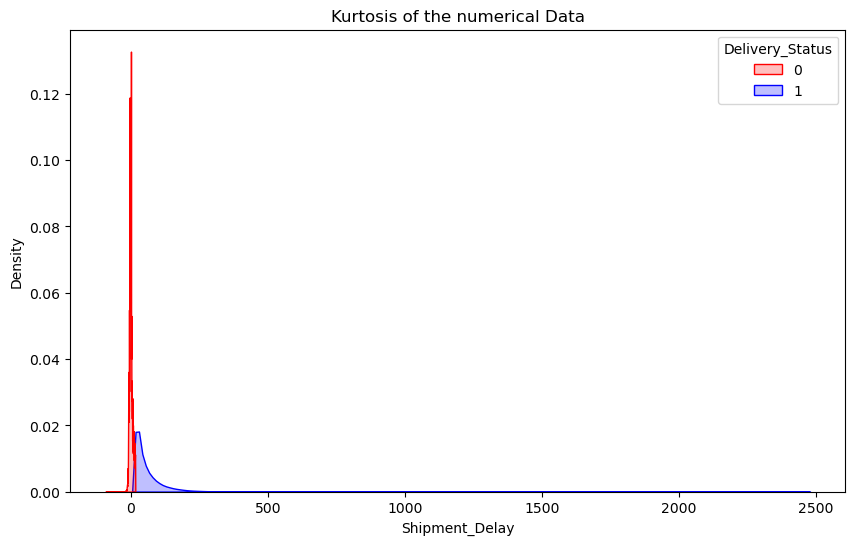

<Figure size 640x480 with 0 Axes>

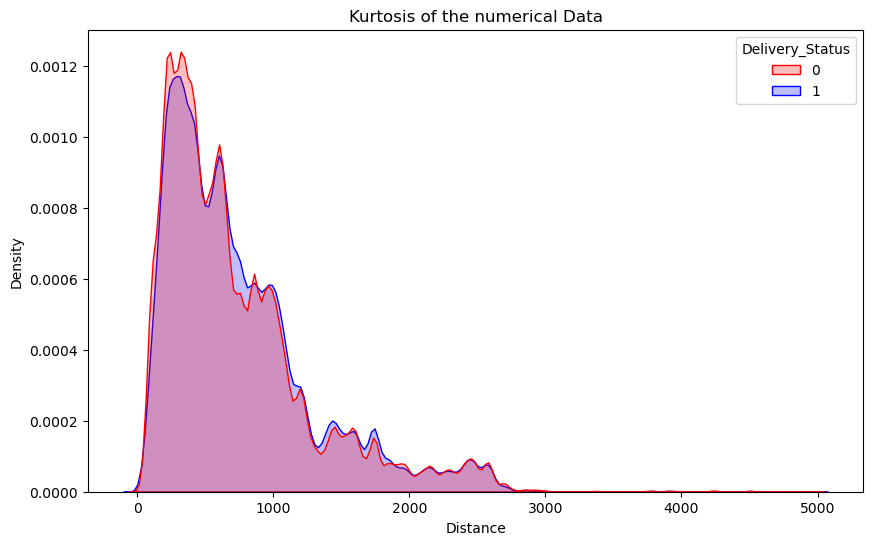

<Figure size 640x480 with 0 Axes>

In [161]:
#Visualize the Kurtosis of the above numerical_cols aata
for column in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(df, x=column, hue='Delivery_Status', palette={0: 'red', 1: 'blue'}, common_norm=False, fill=True)
    plt.title('Kurtosis of the numerical Data')
    plt.show()
    plt.savefig('images/KDE on the Kurtosis_numerical data.png')

<h4> As we can see above the Shipment Delay has the highlest outliers </h4>

In [37]:
df[ordinal_cat_cols].kurt()

Actual_Shipment_Time    -0.985367
Planned_Shipment_Time   -1.045884
Planned_Delivery_Time   -0.602298
dtype: float64

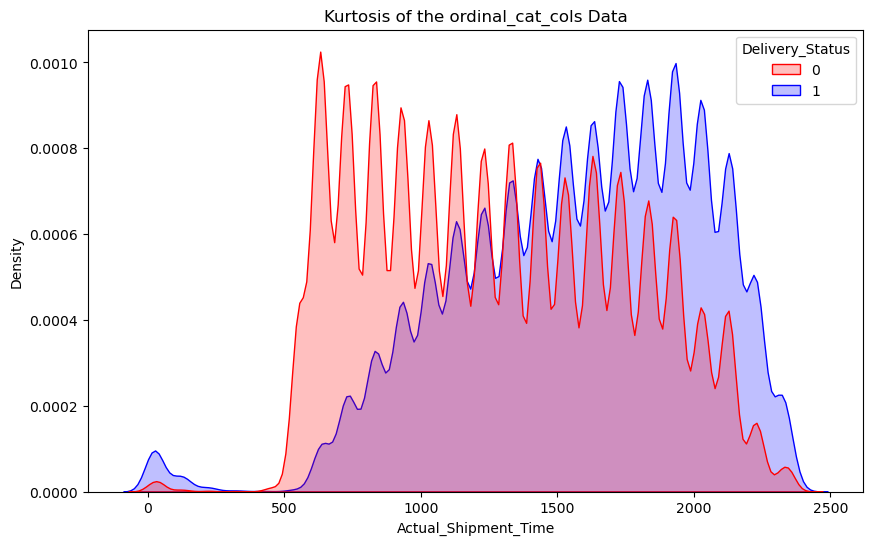

<Figure size 640x480 with 0 Axes>

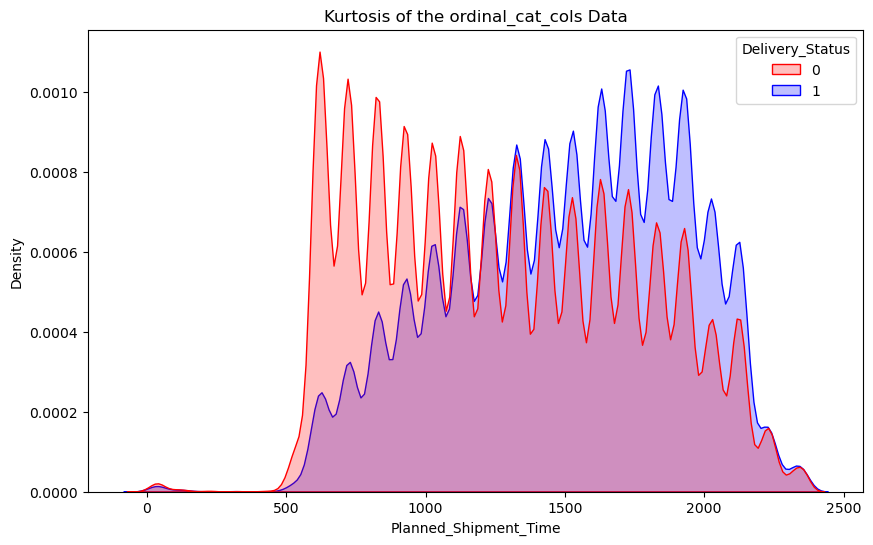

<Figure size 640x480 with 0 Axes>

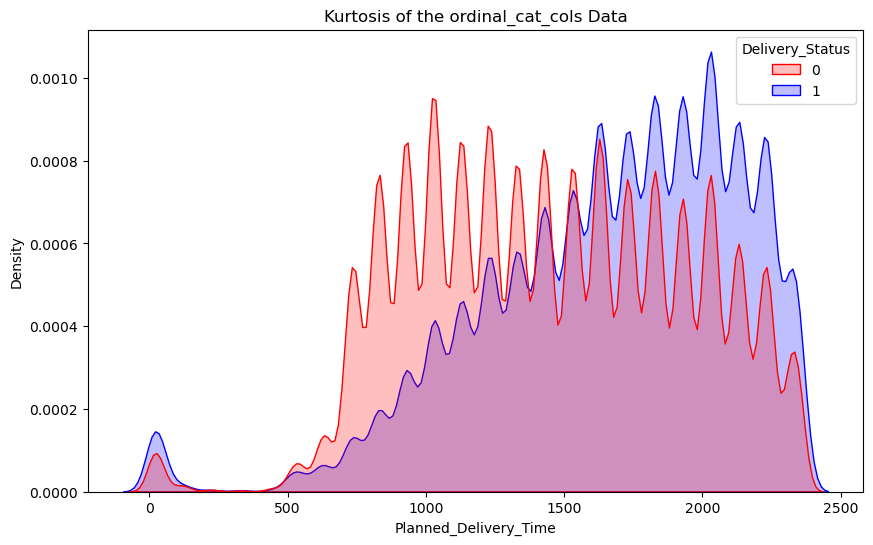

<Figure size 640x480 with 0 Axes>

In [163]:
#Visualize the Kurtosis of the above ordinal_cat_cols data
for column in ordinal_cat_cols:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(df, x=column, hue='Delivery_Status', palette={0: 'red', 1: 'blue'}, common_norm=False, fill=True)
    plt.title('Kurtosis of the ordinal_cat_cols Data')
    plt.show()
    plt.savefig('images/Kde on the ordinal_cat_cols data.png')

<h4> The distribution for the above seems to be pretty well and has few to no outliers as per the kurt scores </h4>

<h4> Probabality plot for the Distance and shipment delay </h4>

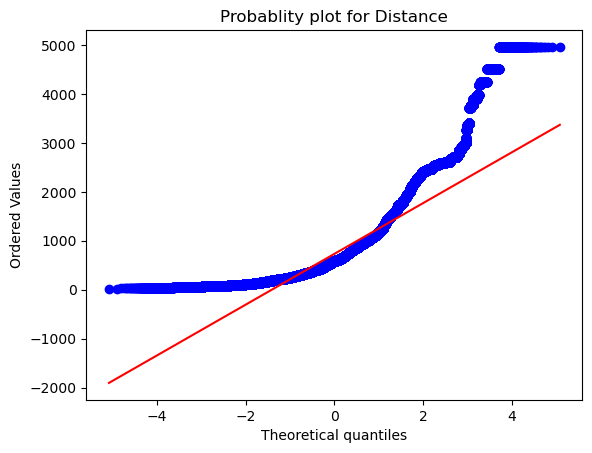

<Figure size 640x480 with 0 Axes>

In [38]:
stats.probplot(df['Distance'], dist = "norm", plot = pylab)
plt.title('Probablity plot for Distance')
plt.show()
plt.savefig('images/Distnace_Probablity Plot.png')

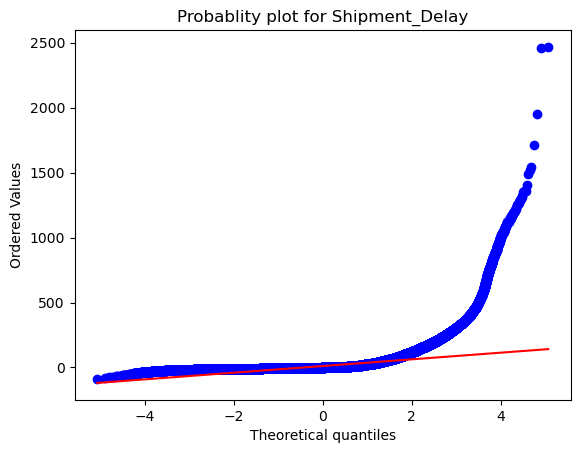

<Figure size 640x480 with 0 Axes>

In [39]:
stats.probplot(df['Shipment_Delay'], dist = "norm", plot = pylab)
plt.title('Probablity plot for Shipment_Delay')
plt.show()
plt.savefig('images/Shipment_Delay Plot.png')

<h4> The reason i choose to get the probabality plot just for these 2 was i want compare the outliers after removing them. </h4>

<h4> Box PLots to visualize the outliers </h4>

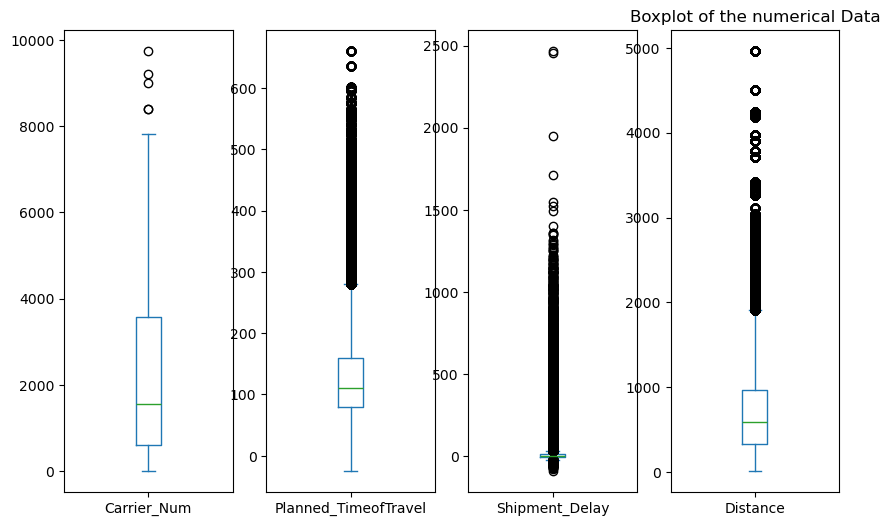

<Figure size 640x480 with 0 Axes>

In [40]:
#Visualize the Boxplots of the above numerical_cols data
df[numerical_cols].plot(kind = 'box', subplots = True, sharey = False, figsize = (10, 6)) 
plt.title('Boxplot of the numerical Data')
plt.show()
plt.savefig('images/boxplots on the numerrical data.png')

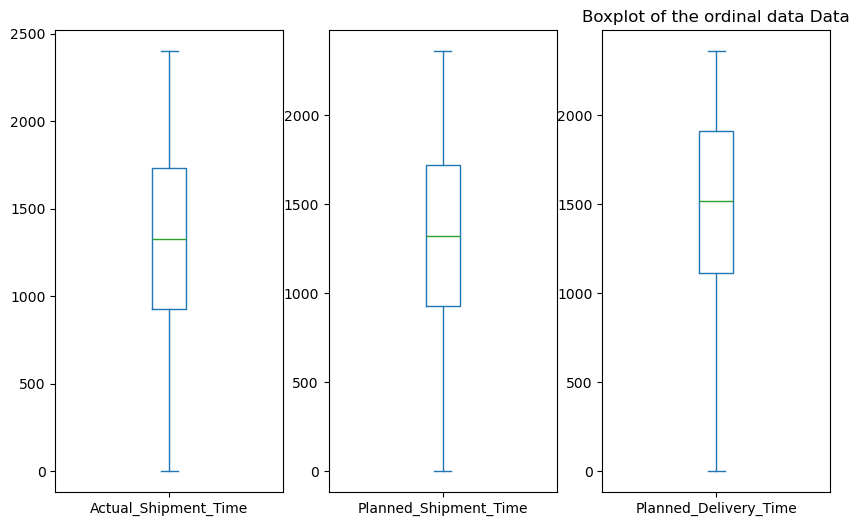

<Figure size 640x480 with 0 Axes>

In [41]:
df[ordinal_cat_cols+['date']].plot(kind = 'box', subplots = True, sharey = False, figsize = (10, 6))
plt.title('Boxplot of the ordinal data Data')
plt.show()
plt.savefig('images/boxplots on the ordinal data.png')

<h4> Dropping Outliers </h4>

In [42]:
# Dropping outliersfor the numerical data.
first_quartile = df['Carrier_Num'].quantile(.25)
third_quartile = df['Carrier_Num'].quantile(.75)
iqr = df['Carrier_Num'].quantile(.75) - df['Carrier_Num'].quantile(.25)
lower = first_quartile - 1.5*iqr
upper = third_quartile + 1.5*iqr
df1_no_outlier = df.loc[(df['Carrier_Num']>lower) & (df['Carrier_Num']<upper)]

In [43]:
# df['Actual_Shipment_Time','Planned_Shipment_Time','Planned_Delivery_Time','Carrier_Name','Carrier_Num',
#    'Planned_TimeofTravel','Shipment_Delay','Source','Destination','Distance ','Delivery_Status','date']

In [44]:
first_quartile = df1_no_outlier['Shipment_Delay'].quantile(.25)
third_quartile = df1_no_outlier['Shipment_Delay'].quantile(.75)
iqr = df1_no_outlier['Shipment_Delay'].quantile(.75) - df1_no_outlier['Shipment_Delay'].quantile(.25)
lower = first_quartile - 1.5*iqr
upper = third_quartile + 1.5*iqr
df2_no_outlier = df1_no_outlier.loc[(df1_no_outlier['Shipment_Delay']>lower) & (df1_no_outlier['Shipment_Delay']<upper)]

In [45]:
first_quartile = df2_no_outlier['Planned_TimeofTravel'].quantile(.25)
third_quartile = df2_no_outlier['Planned_TimeofTravel'].quantile(.75)
iqr = df2_no_outlier['Planned_TimeofTravel'].quantile(.75) - df2_no_outlier['Planned_TimeofTravel'].quantile(.25)
lower = first_quartile - 1.5*iqr
upper = third_quartile + 1.5*iqr
df3_no_outlier = df2_no_outlier.loc[(df2_no_outlier['Planned_TimeofTravel']>lower) & (df2_no_outlier['Planned_TimeofTravel']<upper)]

In [46]:
first_quartile = df3_no_outlier['Distance'].quantile(.25)
third_quartile = df3_no_outlier['Distance'].quantile(.75)
iqr = df3_no_outlier['Distance'].quantile(.75) - df3_no_outlier['Distance'].quantile(.25)
lower = first_quartile - 1.5*iqr
upper = third_quartile + 1.5*iqr
df_no_outlier = df3_no_outlier.loc[(df3_no_outlier['Distance']>lower) & (df3_no_outlier['Distance']<upper)]

<h4> Box plot after removing the outliers </h4>

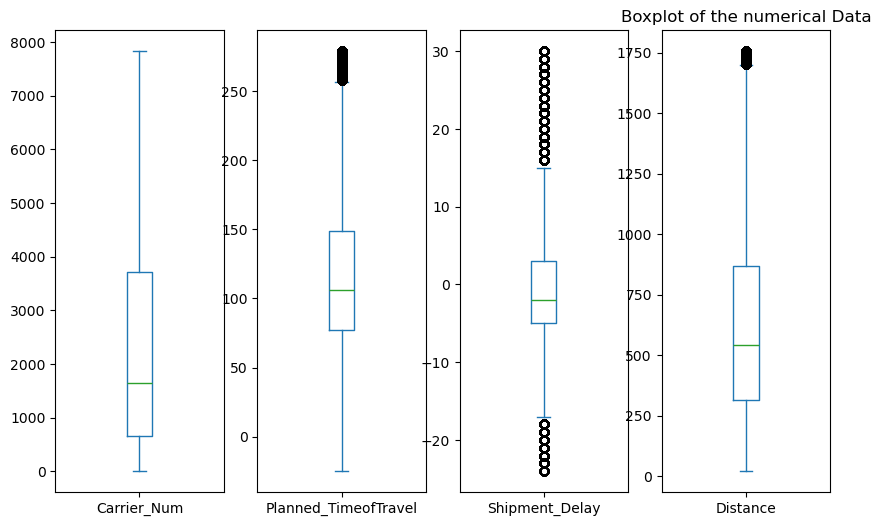

<Figure size 640x480 with 0 Axes>

In [47]:
df_no_outlier[numerical_cols].plot(kind = 'box', subplots = True, sharey = False, figsize = (10, 6)) 
plt.title('Boxplot of the numerical Data')
plt.show()
plt.savefig('images/boxplots1 on the numerrical data.png')

In [48]:
#mean and median on the numerical data before outliers
df[numerical_cols].apply(lambda x: {'mean': x.mean(), 'median': x.median()}, axis=0, result_type='expand')

,Carrier_Num,Planned_TimeofTravel,Shipment_Delay,Distance
mean,2207.062746,129.505781,11.158186,731.615036
median,1562.000000,111.000000,-1.000000,585.000000


In [49]:
#mean and median on the numerical data after outliers
df_no_outlier[numerical_cols].apply(lambda x: {'mean': x.mean(), 'median': x.median()}, axis=0, result_type='expand')

,Carrier_Num,Planned_TimeofTravel,Shipment_Delay,Distance
mean,2292.819828,116.249129,0.677143,623.340521
median,1644.000000,106.000000,-2.000000,541.000000


In [50]:
df.shape

(3522163, 12)

In [51]:
df_no_outlier.shape

(2867821, 12)

# Data improved after dropping the outliers

In [52]:
df_no_outlier.Delivery_Status.value_counts()

Delivery_Status
0    2623700
1     244121
Name: count, dtype: int64

In [53]:
df.Delivery_Status.value_counts()

Delivery_Status
0    2804071
1     718092
Name: count, dtype: int64

<h4> As you can see ther the outliers is improved for Shipment delay, there is room to improve </h4>

<h4> Comapring the probabality without outliers </h4>

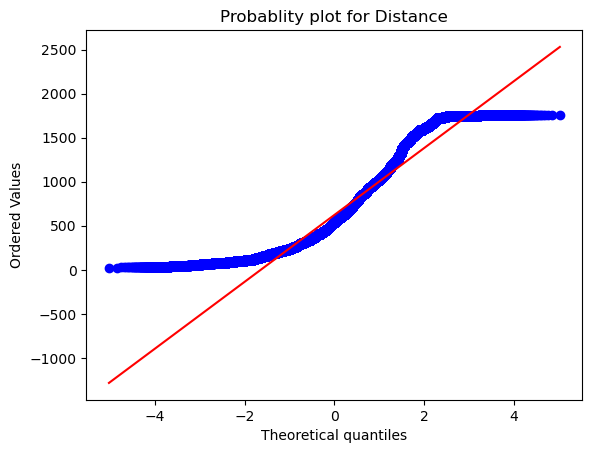

<Figure size 640x480 with 0 Axes>

In [54]:
stats.probplot(df_no_outlier['Distance'], dist = "norm", plot = pylab)
plt.title('Probablity plot for Distance')
plt.show()
plt.savefig('images/Distnace_Probablity Plot_without outliers.png')

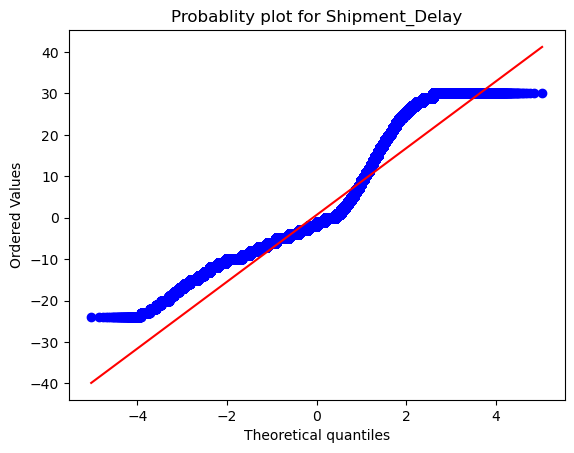

<Figure size 640x480 with 0 Axes>

In [55]:
stats.probplot(df_no_outlier['Shipment_Delay'], dist = "norm", plot = pylab)
plt.title('Probablity plot for Shipment_Delay')
plt.show()
plt.savefig('images/Distnace_Probablity_without outliers Plot.png')

In [56]:
#Skewness and Kurtosis on the data with outliers 
df_no_outlier[numerical_cols].skew()

Carrier_Num             0.841883
Planned_TimeofTravel    0.779011
Shipment_Delay          1.374959
Distance                0.865995
dtype: float64

In [57]:
df_no_outlier[numerical_cols].kurt()

Carrier_Num            -0.341185
Planned_TimeofTravel    0.057918
Shipment_Delay          1.687267
Distance                0.098245
dtype: float64

<h4>  As you can see above the probabality plot and kurt data is much improved after removing the outliers</h4>

<h3> Feature Engineering </h3>

<h4> encoding categorical variables and plotting correlation </h4>

In [58]:
df_no_outlier.Source.unique()

array(['IAD', 'IND', 'ISP', 'JAN', 'JAX', 'LAS', 'LAX', 'LBB', 'LIT',
       'MAF', 'MCI', 'MCO', 'MDW', 'MHT', 'MSY', 'OAK', 'OKC', 'OMA',
       'ONT', 'ORF', 'PBI', 'PDX', 'PHL', 'PHX', 'PIT', 'PVD', 'RDU',
       'RNO', 'RSW', 'SAN', 'SAT', 'SDF', 'SEA', 'SFO', 'SJC', 'SLC',
       'SMF', 'SNA', 'STL', 'TPA', 'TUL', 'TUS', 'ABQ', 'ALB', 'AMA',
       'AUS', 'BDL', 'BHM', 'BNA', 'BOI', 'BUF', 'BUR', 'BWI', 'CLE',
       'CMH', 'CRP', 'DAL', 'DEN', 'DTW', 'ELP', 'FLL', 'GEG', 'HOU',
       'HRL', 'ROC', 'DAY', 'EWR', 'IAH', 'LFT', 'MKE', 'CHS', 'LCH',
       'CLT', 'BTR', 'CRW', 'FAT', 'COS', 'MRY', 'LGB', 'BFL', 'EUG',
       'ICT', 'MEM', 'LGA', 'DCA', 'GRK', 'BRO', 'TYS', 'DSM', 'BPT',
       'GPT', 'PWM', 'MSP', 'RIC', 'CVG', 'SAV', 'SRQ', 'ORD', 'GSO',
       'CHA', 'XNA', 'GSP', 'LEX', 'MFE', 'ABE', 'MLU', 'MOB', 'LRD',
       'TLH', 'CAE', 'BTV', 'SYR', 'AEX', 'ATL', 'SHV', 'GRR', 'DFW',
       'AVL', 'BOS', 'MSN', 'HSV', 'MGM', 'BGR', 'MYR', 'VPS', 'CLL',
       'PNS', 'MTJ',

In [59]:
df_no_outlier.Destination.unique()

array(['TPA', 'BWI', 'JAX', 'LAS', 'MCI', 'MCO', 'MDW', 'PHX', 'FLL',
       'PBI', 'RSW', 'HOU', 'BHM', 'BNA', 'IND', 'ORF', 'PHL', 'ABQ',
       'AUS', 'BOI', 'BUR', 'DEN', 'ELP', 'GEG', 'LAX', 'LIT', 'MAF',
       'MSY', 'OAK', 'OKC', 'OMA', 'ONT', 'PDX', 'RNO', 'SAN', 'SAT',
       'SDF', 'SEA', 'SFO', 'SJC', 'SLC', 'SMF', 'SNA', 'STL', 'TUS',
       'DAL', 'ALB', 'BDL', 'BUF', 'CLE', 'CMH', 'DTW', 'IAD', 'ISP',
       'MHT', 'PIT', 'PVD', 'RDU', 'TUL', 'HRL', 'LBB', 'JAN', 'AMA',
       'CRP', 'EWR', 'IAH', 'XNA', 'DCA', 'GSO', 'ROC', 'MYR', 'SYR',
       'ATL', 'RIC', 'COS', 'FAT', 'MRY', 'LGB', 'BFL', 'EUG', 'ICT',
       'SAV', 'MSN', 'DAY', 'BTR', 'TLH', 'DFW', 'LFT', 'PWM', 'SHV',
       'MKE', 'CHS', 'CRW', 'HSV', 'TYS', 'MTJ', 'MGM', 'MFE', 'GRR',
       'MEM', 'BTV', 'CLT', 'MSP', 'BRO', 'CVG', 'LGA', 'VPS', 'LEX',
       'BPT', 'ORD', 'ABE', 'GSP', 'LRD', 'BGR', 'GRK', 'LCH', 'AEX',
       'AVL', 'MLU', 'GPT', 'MOB', 'BOS', 'DSM', 'PNS', 'CAE', 'CHA',
       'CLL', 'PSP',

In [60]:
df_no_outlier.Carrier_Name.unique()

array(['WN', 'XE', 'YV', 'OH', 'OO', 'UA', 'US', 'DL', 'EV', 'F9', 'FL',
       'HA', 'MQ', 'NW', '9E', 'AA', 'AQ', 'AS', 'B6', 'CO'], dtype=object)

In [61]:
oe = OrdinalEncoder(categories = [['WN', 'XE', 'YV', 'OH', 'OO', 'UA', 'US', 'DL', 'EV', 'F9', 'FL',
       'HA', 'MQ', 'NW', '9E', 'AA', 'AQ', 'AS', 'B6', 'CO']])
df_no_outlier['Carrier_Name_coder'] = oe.fit_transform(df_no_outlier[['Carrier_Name']])

In [62]:
oe = OrdinalEncoder(categories = [['TPA', 'BWI', 'JAX', 'LAS', 'MCI', 'MCO', 'MDW', 'PHX', 'FLL',
       'PBI', 'RSW', 'HOU', 'BHM', 'BNA', 'IND', 'ORF', 'PHL', 'ABQ',
       'AUS', 'BOI', 'BUR', 'DEN', 'ELP', 'GEG', 'LAX', 'LIT', 'MAF',
       'MSY', 'OAK', 'OKC', 'OMA', 'ONT', 'PDX', 'RNO', 'SAN', 'SAT',
       'SDF', 'SEA', 'SFO', 'SJC', 'SLC', 'SMF', 'SNA', 'STL', 'TUS',
       'DAL', 'ALB', 'BDL', 'BUF', 'CLE', 'CMH', 'DTW', 'IAD', 'ISP',
       'MHT', 'PIT', 'PVD', 'RDU', 'TUL', 'HRL', 'LBB', 'JAN', 'AMA',
       'CRP', 'EWR', 'IAH', 'XNA', 'DCA', 'GSO', 'ROC', 'MYR', 'SYR',
       'ATL', 'RIC', 'COS', 'FAT', 'MRY', 'LGB', 'BFL', 'EUG', 'ICT',
       'SAV', 'MSN', 'DAY', 'BTR', 'TLH', 'DFW', 'LFT', 'PWM', 'SHV',
       'MKE', 'CHS', 'CRW', 'HSV', 'TYS', 'MTJ', 'MGM', 'MFE', 'GRR',
       'MEM', 'BTV', 'CLT', 'MSP', 'BRO', 'CVG', 'LGA', 'VPS', 'LEX',
       'BPT', 'ORD', 'ABE', 'GSP', 'LRD', 'BGR', 'GRK', 'LCH', 'AEX',
       'AVL', 'MLU', 'GPT', 'MOB', 'BOS', 'DSM', 'PNS', 'CAE', 'CHA',
       'CLL', 'PSP', 'DAB', 'SRQ', 'ILM', 'JFK', 'MDT', 'ASE', 'COD',
       'CPR', 'DRO', 'EGE', 'GJT', 'HDN', 'RAP', 'ITO', 'KOA', 'LIH',
       'OGG', 'ROA', 'SPI', 'HNL', 'SBA', 'SBP', 'YUM', 'ATW', 'BMI',
       'CAK', 'CID', 'CWA', 'FWA', 'GRB', 'LAN', 'MBS', 'SBN', 'FLG',
       'TEX', 'MFR', 'FSD', 'CLD', 'AVP', 'TVC', 'MLB', 'SGF', 'TRI',
       'MIA', 'TWF', 'PIH', 'SUN', 'EKO', 'SGU', 'PSC', 'BTM', 'BIL',
       'FAR', 'BZN', 'MSO', 'FCA', 'HLN', 'GTF', 'IDA', 'LWS', 'YKM',
       'SLE', 'RDM', 'BLI', 'JAC', 'IYK', 'SMX', 'ACV', 'OXR', 'RDD',
       'MOD', 'CEC', 'CIC', 'IPL', 'LNK', 'PIA', 'AZO', 'MLI', 'HPN',
       'GUC', 'PMD', 'BIS', 'RFD', 'CDC', 'OGD', 'STT', 'SJU', 'STX',
       'PHF', 'MCN', 'VLD', 'CSG', 'SWF', 'BQK', 'DHN', 'ABY', 'AGS',
       'MEI', 'FAY', 'EWN', 'SCE', 'EYW', 'EVV', 'PFN', 'GNV', 'OAJ',
       'FNT', 'CHO', 'FSM', 'FLO', 'HHH', 'TOL', 'LYH', 'GTR', 'TUP',
       'ACY', 'LAW', 'TYR', 'ABI', 'TXK', 'ACT', 'SPS', 'SJT', 'GGG',
       'CMI', 'ROW', 'MQT', 'RST', 'LSE', 'DBQ', 'DLH', 'GFK', 'MOT',
       'RHI', 'SUX', 'CMX', 'BGM', 'PLN', 'ERI', 'ALO', 'ELM', 'ANC',
       'FAI', 'KTN', 'SIT', 'JNU', 'WRG', 'PSG', 'BET', 'CDV', 'YAK',
       'OME', 'OTZ', 'ADQ', 'BRW', 'SCC', 'ADK', 'BQN', 'PSE', 'GCC',
       'RKS', 'CYS', 'MKG', 'AKN', 'DLG', 'LWB', 'ACK', 'WYS', 'INL',
       'BJI', 'GST']])
df_no_outlier['Destination_coder'] = oe.fit_transform(df_no_outlier[['Destination']])

In [63]:
oe = OrdinalEncoder(categories = [['IAD', 'IND', 'ISP', 'JAN', 'JAX', 'LAS', 'LAX', 'LBB', 'LIT',
       'MAF', 'MCI', 'MCO', 'MDW', 'MHT', 'MSY', 'OAK', 'OKC', 'OMA',
       'ONT', 'ORF', 'PBI', 'PDX', 'PHL', 'PHX', 'PIT', 'PVD', 'RDU',
       'RNO', 'RSW', 'SAN', 'SAT', 'SDF', 'SEA', 'SFO', 'SJC', 'SLC',
       'SMF', 'SNA', 'STL', 'TPA', 'TUL', 'TUS', 'ABQ', 'ALB', 'AMA',
       'AUS', 'BDL', 'BHM', 'BNA', 'BOI', 'BUF', 'BUR', 'BWI', 'CLE',
       'CMH', 'CRP', 'DAL', 'DEN', 'DTW', 'ELP', 'FLL', 'GEG', 'HOU',
       'HRL', 'ROC', 'DAY', 'EWR', 'IAH', 'LFT', 'MKE', 'CHS', 'LCH',
       'CLT', 'BTR', 'CRW', 'FAT', 'COS', 'MRY', 'LGB', 'BFL', 'EUG',
       'ICT', 'MEM', 'LGA', 'DCA', 'GRK', 'BRO', 'TYS', 'DSM', 'BPT',
       'GPT', 'PWM', 'MSP', 'RIC', 'CVG', 'SAV', 'SRQ', 'ORD', 'GSO',
       'CHA', 'XNA', 'GSP', 'LEX', 'MFE', 'ABE', 'MLU', 'MOB', 'LRD',
       'TLH', 'CAE', 'BTV', 'SYR', 'AEX', 'ATL', 'SHV', 'GRR', 'DFW',
       'AVL', 'BOS', 'MSN', 'HSV', 'MGM', 'BGR', 'MYR', 'VPS', 'CLL',
       'PNS', 'MTJ', 'DAB', 'PSP', 'ASE', 'ATW', 'BMI', 'CLD', 'COD',
       'CPR', 'CWA', 'DRO', 'EGE', 'FLG', 'GJT', 'HDN', 'HNL', 'ILM',
       'ITO', 'JFK', 'KOA', 'LIH', 'MDT', 'MFR', 'OGG', 'RAP', 'ROA',
       'SBA', 'SBN', 'SBP', 'SPI', 'TEX', 'YUM', 'CAK', 'FSD', 'FWA',
       'LAN', 'MBS', 'AVP', 'GRB', 'TVC', 'CID', 'HPN', 'MLB', 'SGF',
       'MIA', 'TRI', 'ACY', 'TWF', 'SUN', 'PIH', 'EKO', 'SGU', 'PSC',
       'BTM', 'SLE', 'IDA', 'HLN', 'FCA', 'MSO', 'GTF', 'LWS', 'YKM',
       'BZN', 'BIL', 'RDM', 'FAR', 'JAC', 'IYK', 'SMX', 'ACV', 'OXR',
       'RDD', 'CEC', 'MOD', 'CIC', 'IPL', 'PIA', 'GUC', 'LNK', 'MLI',
       'PMD', 'BIS', 'RFD', 'BLI', 'AZO', 'CDC', 'SJU', 'STT', 'STX',
       'PHF', 'DHN', 'PFN', 'TOL', 'AGS', 'FAY', 'HHH', 'EVV', 'GNV',
       'ABY', 'FNT', 'OAJ', 'BQK', 'SWF', 'EWN', 'MEI', 'GTR', 'LYH',
       'FSM', 'EYW', 'VLD', 'CSG', 'MCN', 'CHO', 'TUP', 'FLO', 'SCE',
       'TYR', 'LAW', 'SPS', 'ABI', 'GGG', 'ACT', 'SJT', 'TXK', 'CMI',
       'ROW', 'RST', 'MQT', 'LSE', 'DBQ', 'GFK', 'MOT', 'DLH', 'SUX',
       'PLN', 'BGM', 'ERI', 'ALO', 'CMX', 'RHI', 'ELM', 'ANC', 'JNU',
       'ADQ', 'KTN', 'FAI', 'SIT', 'WRG', 'SCC', 'BET', 'CDV', 'YAK',
       'BRW', 'OTZ', 'PSG', 'OME', 'ADK', 'BQN', 'PSE', 'GCC', 'RKS',
       'MKG', 'DLG', 'AKN', 'LWB', 'ACK', 'WYS', 'BJI', 'INL', 'GST']])
df_no_outlier['Source_coder'] = oe.fit_transform(df_no_outlier[['Source']])

In [64]:
df_no_outlier = df_no_outlier.drop(['Carrier_Name','Source','Destination'], axis=1)

In [65]:
df_no_outlier.sample(10)

,Actual_Shipment_Time,Planned_Shipment_Time,Planned_Delivery_Time,Carrier_Num,Planned_TimeofTravel,Shipment_Delay,Distance,Delivery_Status,date,Carrier_Name_coder,Destination_coder,Source_coder
1046872,1206,1210,1244,5768,94,-4,441,0,2008-02-05,14.0,99.0,101.0
2966619,732,735,901,1757,86,-3,282,0,2008-05-02,19.0,48.0,66.0
2266766,908,910,1225,368,135,-2,888,0,2008-04-07,15.0,109.0,57.0
1863531,1059,1035,1340,3830,185,24,1111,1,2008-04-25,0.0,0.0,46.0
1852968,1927,1925,1935,518,70,2,328,0,2008-04-22,0.0,7.0,42.0
3156481,1245,1230,1425,5652,115,15,541,0,2008-06-16,3.0,131.0,72.0
1631797,1724,1726,1907,1630,101,-2,614,0,2008-03-19,13.0,56.0,58.0
3148366,1635,1635,1635,5531,60,0,170,0,2008-06-02,3.0,230.0,94.0
3345593,700,705,826,569,141,-5,853,0,2008-06-24,9.0,34.0,57.0
712947,701,705,1043,2708,158,-4,1055,0,2008-02-28,1.0,64.0,3.0


In [66]:
#examine Correlations :
highest_corr = df_no_outlier.corr()[['Delivery_Status']].nlargest(columns = 'Delivery_Status', n = 2).index[1]
print(highest_corr)

Shipment_Delay


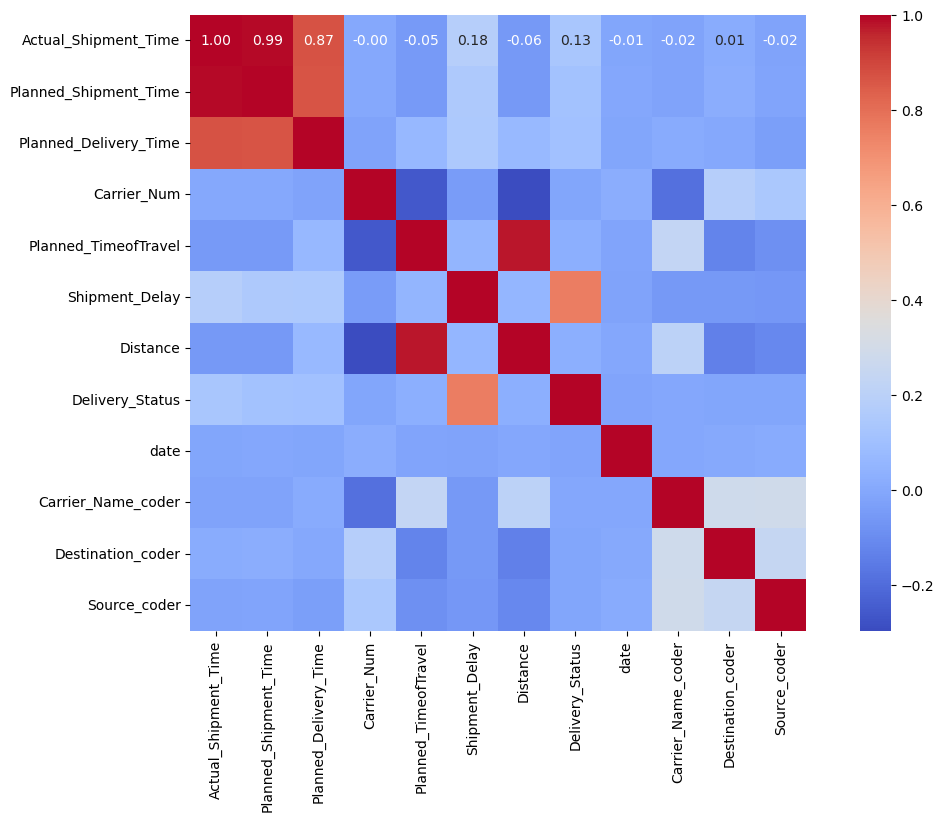

In [67]:
#Correlation matrix and heatmap after converting the features
correlation = df_no_outlier.corr()
plt.figure(figsize=(14, 8))
sns.heatmap(correlation, annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.savefig('images/heap_map1.png')

In [69]:
df_no_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2867821 entries, 0 to 3604173
Data columns (total 12 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   Actual_Shipment_Time   int32         
 1   Planned_Shipment_Time  int64         
 2   Planned_Delivery_Time  int64         
 3   Carrier_Num            int64         
 4   Planned_TimeofTravel   int32         
 5   Shipment_Delay         int32         
 6   Distance               int64         
 7   Delivery_Status        int32         
 8   date                   datetime64[ns]
 9   Carrier_Name_coder     float64       
 10  Destination_coder      float64       
 11  Source_coder           float64       
dtypes: datetime64[ns](1), float64(3), int32(4), int64(4)
memory usage: 240.7 MB


<h4> After looking at the correlation plot above , i will not remove any features except date in the initial round of modeling and in the next round of modleing i will plan to drop Carrier_Num, Distance, Planned_TimeoTravel as they are highly negatively impacted </h4>

<Figure size 1400x800 with 0 Axes>

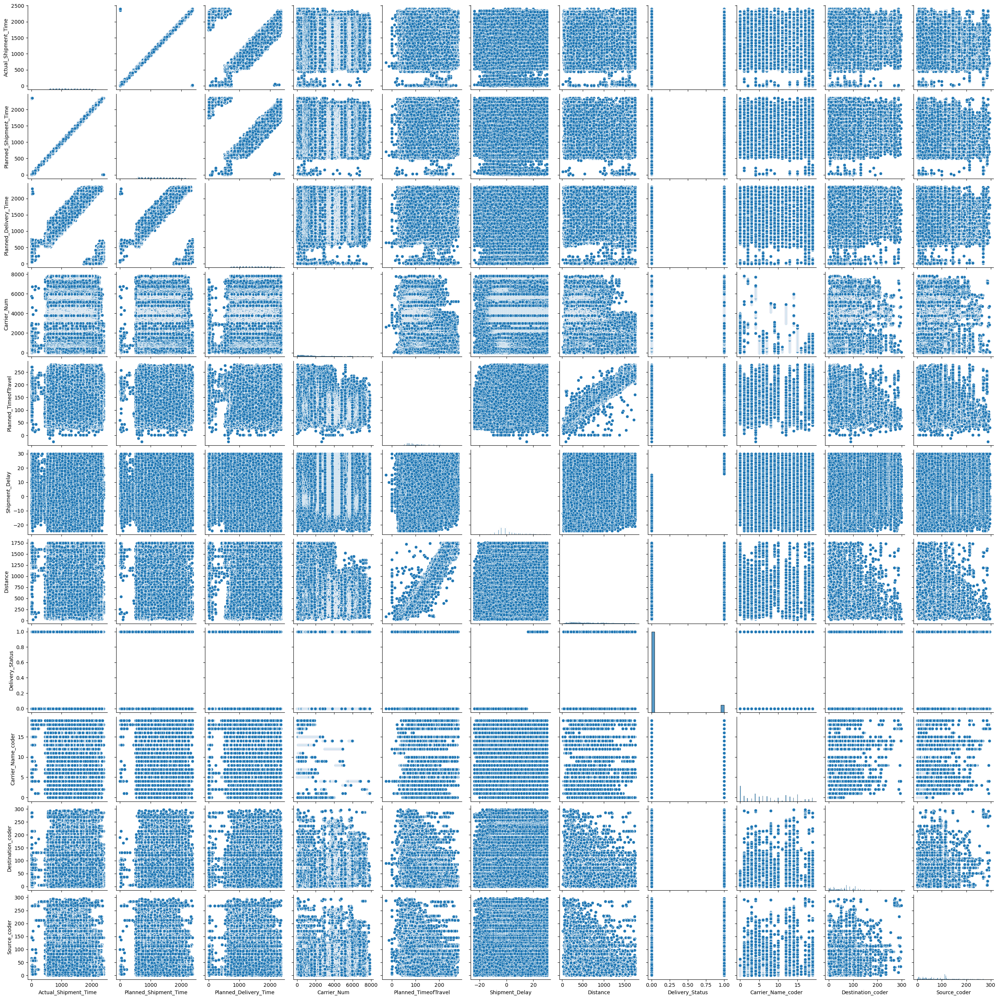

In [443]:
#PairPlot
plt.figure(figsize=(14, 8))
sns.pairplot(df_no_outlier)
plt.savefig('images/par_plot.png')

# Save the dataframe to a CSV file

In [68]:
df_no_outlier.to_csv('data/df_with_no_outliers.csv', index=False)